# Project Background

A charge-off for a loan is a declaration by a creditor (bank or credit card company) that an amount of debt is unlikely to be collected. The occurrence happens when a consumer becomes severely delinquent on a debt. Creditors make this declaration at the point of six months without payment. Every charge-off that occurs means lost revenue for the creditor. If the number of charge-offs climbs, officials from credit regulatory agencies will closely monitor the creditor's finances and may impose various operating restrictions or in extreme cases shut down the business. It is imperative for creditors to 1) understand what factors most influence a loan being charged off and 2) have a model that predicts loan charge-offs that are likely to happen in the future. A dataset with thousands of borrower's/consumer's loan histories will be examined for this report.

Dataset Source: https://www.kaggle.com/azeem1607/credit-prediction-interest-rate-environments

###  Objective
Create a model for the client (creditor) that predicts whether a consumer's loan will be charged-off. Provide key model insights to help client understand what factors most influence loan default. Issue recommendations for minimizing future loan charge-offs. 
 

###  Process
For this project, the Data Science Consultant will perform a detailed analysis using the following process:

- Exploratory Data Analysis to determine interesting or unusual patterns in the data and relationships between variables
- Data Preparation for Modeling
- Creation of a baseline model to predict loan charge-off
- Feature Engineering to improve model performance
- Comparisons of various models through evaluation to determine most effective modeling method for business objective
- Conclusions and Summary

### Dataset Description
The dataset consists of 50,000 rows and 18 columns. 

### Input variables








1 - **Current Loan Amount** (numeric)

2 - **Term** : Length of Loan (categorical: 'Short Term', 'Long Term')

3 - **Credit Score** : consumer's credit score (numeric)

4 - **Annual Income**: consumer's income (numeric')

5 - **Years in Current Job**: borrower's tenure in current role (categorical: '1 year', ' 2 years', '3 years', '4 years', '5 years', ' 6 years', '7 years', '8 years', '9 years', '10+ years'  )

6 - **Home Ownership**: (categorical: 'Home Mortgage','Rent','Own Home', 'Have Mortgage')

7 - **Purpose**: consumer's purpose for the loan (categorical: 'Debt Consolidation','other','Home Improvements', 'Other','Business Loan', 'Buy a Car', 'Medical Bills', 'Buy House', 'Take a Trip', 'Major Purchase', 'Small Business', 'Moving', 'Wedding', 'Educational Expenses', 'Vacation', 'Renewable Energy')

8 - **Monthly Debt**: borrower's monthly debt (numeric)

9 - **Years of Credit History**: (numeric)

10 - **Months Since Last Delinquent**: number of months since borrowers missed their due date for payment (numeric)

11 - **Number of Open Accounts**: consumer's credit accounts (credit cards, lines of credit) (numeric)


12 - **Number of Credit Problems**: any tabulation of issues with borrower's credit (numeric)

13 - **Current Credit Balance**: borrower's present balance of outstanding credit (numeric)

14 - **Maximum Open Credit**: current total of borrower's credit limit (numeric)

15 - **Interest Rate**: rate of interest loan was issued at (numeric)

16 - **Bankruptcies**: number of times borrower declared bankruptcy - (numeric)

17 - **Tax Liens**: number of times a borrower had a lien imposed by law to secure payment of taxes - (numeric)


### Predict variable (desired target):

**Loan Status**: Did borrower pay off loan or fail to pay back loan (categorical: 'Fully Paid', 'Charged-Off')

# Project Setup

In [1]:
#import libraris for project setup
import numpy as np
import pandas as pd  
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
#import dataset
loan = pd.read_csv('Credit.csv')

In [ ]:
#inspect dataset
loan.head()

# Exploratory Data Analysis

In [3]:
# In-depth Data Exploration with Pandas Profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(loan, title = 'Exploratory Loan Report', explorative = True)
profile

###  Observations from Exploratory Data Analysis


- The target variable, Loan Status, is imbalanced with 77.3% of the values as Fully Paid and 22.7% as Charged Off. 


* High Correlation between the following variables


    - Number of Credit Problems and Bankruptcies
    - Number of Credit Problems and Tax Liens
    - Monthly Debt and Current Credit Card Balance


- 7 variables have missing values

    1. Credit Score
    2. Annual Income
    3. Years in Current Job
    4. Months Since Last Delinquent
    5. Tax Liens
    6. Bankruptcies 
    7. Maximum Open Credit
    

- The dataset contains 527 duplicate rows


- The Credit Score variable contains 2301 rows where the score is greater than 850, which is incorrect and possibly related to a data entry error. 


- The Current loan amount variable has 5691 rows with the extreme value of 99,999,999



- Years in current role has 11 distinct values


- The Home ownership variable has 4 levels, but 2 of which are similar, (Home Mortgage and Have Mortgage)


- The Purpose variable has 16 levels


- The following variables contain outliers

   1. Monthly Debt
   2. Years of Credit History 
   3. Months Since Last Delinquent
   4. Number of Open Accounts
   5. Number of Credit Problems 
   6. Current Credit Balance
   7. Maximum Open Credit
   8. Bankruptcies
   9. Credit Score
   10. Annual Income
   11. Current Loan Amount
   

- Annual Income, Current Credit Balance,  Maximum Open Credit are highly skewed
   


# Data Preparation

#### Missing Values

First, the missing values in seven variables must be addressed. Missing observations could potentially have valuable information related to the business objective, and outright deletion would be unwise. For Credit Score, Annual Income, Maximum Open Credit and Months Since Last Delinquent, the recommended strategy is to fill missing values with the median value of each variable. Median is preferred to mean, because these variables all have outliers and the Median is a resistant measure of center. 

Years in Current Job is a categorical variable with 4.2% of the values missing. The most common value, 10 + years, which has a frequency of 30.9%, far greater than the other values. Therefore it is recommended to impute the missing values with the mode of 10 + years.


Tax Liens has only 2 missing records. 98% of this variable is the value of 0 and those missing records will be filled with that number. Bankruptcies also has the majority of its values as 0 and therefore can be replaced with that as well.

In [3]:
# Fill Missing Values of Credit Score with Median of 724
loan['Credit Score'].fillna(724, inplace = True)

# Fill Missing Values of Maximum Open Credit with Median of 467368
loan['Maximum Open Credit'].fillna(467368, inplace = True)

# Fill Missing Values of Annual Income with Median of 1179168.5
loan['Annual Income'].fillna(1179168.5, inplace= True)

# Fill Missing Values of Months Since Last Delinquent with median of 32
loan['Months since last delinquent'].fillna(32, inplace = True)

# Fill Missing Values of Years in Current Job with mode of '10 + years'
loan['Years in current job'].fillna('10+ years', inplace = True)

# Fill Missing Values of Tax Liens with mode of 0
loan['Tax Liens'].fillna(0, inplace = True)

# Fill Missing Values of Bankruptcie with mode of 0
loan['Bankruptcies'].fillna(0, inplace = True)

#### Duplicate Values

There are 527 duplicate records in the dataset that must be removed prior to modeling. 



In [4]:
# Remove Duplicates
loan = loan.drop_duplicates()

####  Extreme Value Removal

The current loan amount variable has 5691 observations with the value of 99999999, well above a median of 310,222 and 75th percentile of 523,259. These entries are most likely an error. Leaving them unchanged greatly skews this variable and ultimately can impact model results. Fortunately, the dataset is large enough where it would advisable to remove these observations, without loosing much insight. 


In [5]:
loan.drop(loan[loan['Current Loan Amount'] == 99999999].index, inplace = True)

#### Credit Score

Credit scores in most countries are 3 digits, with a typical range of 0 to 999 or 300 to 850 . In this dataset there are 2301 observations where the value is 4 digits. One can assume that this is likely due to a data entry error and should be corrected prior to modeling or else the increased range may skew final results. 

In [6]:
# Correcting Credit Score to 3 digits

loan['Credit Score'] = loan['Credit Score'].astype(str).str[:3].astype(int)

#### Years in Current Job

The Years in Current Job variable is categorical and contains 11 distinct levels. Since these values are ordinal in nature, they can be transformed into integers corresponding to length of service. 





In [7]:
# Replace Years in current job levels with corresponding integers

loan['Years in current job'].replace('< 1 year', 0, inplace = True) 

loan['Years in current job'].replace('1 year', 1, inplace = True)

loan['Years in current job'].replace('2 years', 2, inplace = True)

loan['Years in current job'].replace('3 years', 3, inplace = True)

loan['Years in current job'].replace('4 years', 4, inplace = True)

loan['Years in current job'].replace('5 years', 5, inplace = True)

loan['Years in current job'].replace('6 years', 6, inplace = True)

loan['Years in current job'].replace('7 years', 7, inplace = True)

loan['Years in current job'].replace('8 years', 8, inplace = True)

loan['Years in current job'].replace('9 years', 9, inplace = True)

loan['Years in current job'].replace('10+ years', 10, inplace = True)

#### Encode Categorical Predictor Variables

Home Ownership, Term and Purpose are categorical variables that must be One-Hot encoded in preparation for predictive models.

In [8]:
# Encode Categorical Predictor Variables

loan = pd.get_dummies(loan, columns= [ 'Home Ownership','Term', 'Purpose'])

#### Encode Target Variable 

Loan status is currently listed in text format as either 'Fully Paid' or 'Charged Off'. Target variables must also be converted to numeric form for modeling. The business goal is to predict whether a customer will become delinquent and the highest class of interest is 1. Therefore, fully paid will be encoded as 0 and charged-off as 1. 

In [9]:
# Target variable encoding

loans_dict = {'Fully Paid':0, 'Charged Off' :1}

loan['Loan Status'] = loan['Loan Status'].apply(lambda x: loans_dict[x])

# Baseline Model

With the preliminary data preparation complete, a baseline model can be created to predict the charge-off of a loan. A Decision Tree model will be created, as this method provides a good starting point for the project and will reveal future alterations that must be made. In particular, the Decision Tree's variable importance feature will allow for the understanding of what predictor variables are most impactful to loan charge-offs, and could provide keen insight for feature engineering. 

#### Splitting the data for building and evaluation

In order to build and test an appropriate model, the data is split into a training and test set. This dataset is larger, so an 80/20 training test split will suffice. 

In [10]:
X = loan.drop(columns= ['Loan Status'])
y = loan['Loan Status']

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0) 

## Decision Tree

In [12]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
    
dectree = DecisionTreeClassifier()
dectree.fit(X_train, y_train)


DecisionTreeClassifier()

In [13]:
y_pred = dectree.predict(X_test)

#### Evaluation

In [14]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.76      0.75      0.75      8124
           1       0.30      0.31      0.30      2822

    accuracy                           0.64     10946
   macro avg       0.53      0.53      0.53     10946
weighted avg       0.64      0.64      0.64     10946



In [15]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, y_pred)

0.5295619003950462

#### Feature Importances

In [18]:
feature_importances = pd.DataFrame(dectree.feature_importances_, index= X.columns, columns= ['Feature Importance'])
feature_importances

,Feature Importance
Current Loan Amount,0.110553
Credit Score,0.074524
Annual Income,0.096620
Years in current job,0.043921
Monthly Debt,0.115405
Years of Credit History,0.107473
Months since last delinquent,0.064434
Number of Open Accounts,0.063034
Number of Credit Problems,0.008951
Current Credit Balance,0.104061


## Baseline Model Summary



|Model |Accuracy| Precision| Recall | AUC|
|------|------|----------|----------|----|
|Decision Tree|66 % |.55| .55|.55|

The Decision Tree had a mediocre accuracy scores of 66%. However accuracy alone isn't a good measure of performance in this context because of the imbalance of the target variable. The focus is on predicting a charged-off loan, and as such precision and recall are better measures of model performance and preliminary results indicate need for improvement. The AUC score of this models was poor at 55%. This indicates that the model is only slightly better than guessing between class 0 and 1.

Moving on to the individual variables, Current Loan Amount ranks as the most important predictor by weight from the Decision Tree variable importance feature. Additional tools such as Rapid Miner were also used to determine the importance of each feature for the baseline model. The conclusion is: Credit Score, Number of Open Accounts, Years in Current Job, Annual Income, Monthly Debt, Current Credit Balance, and Maximum Open Credit are important predictors. In contrast, Tax Liens, Interest Rate, Home Ownership (save for rent), and all Purpose columns except "Debt consolidation" are weak predictors. These variables will be removed moving forward.


In [10]:
# dropping weak predcitors 

loan_clean = loan.drop(columns = ['Tax Liens', 'Interest Rate','Home Ownership_Own Home', 'Home Ownership_HaveMortgage', 
                                  'Purpose_Business Loan', 
                                  'Purpose_Buy House', 'Purpose_Buy a Car', 
                                  'Purpose_Educatiol Expenses', 'Purpose_Home Improvements', 'Purpose_Medical Bills', 
                                  'Purpose_Other', 'Purpose_Take a Trip', 'Purpose_major_purchase', 'Purpose_moving', 
                                  'Purpose_other', 'Purpose_renewable_energy', 'Purpose_small_business', 
                                  'Purpose_vacation', 'Purpose_wedding', 'Home Ownership_HaveMortgage', 
                                  'Home Ownership_Own Home', 'Home Ownership_Home Mortgage'])

In [ ]:
# keep copy of clean data file
loan_clean.to_csv('loan_clean.csv', index = False)

# Feature Engineering

### Debt to Income Ratio & Monthly Income

Annual Income and Monthly Debt are important variables that if combined may reveal important insights. In the credit world, debt-to-income ratio is a consumers monthly payments divided by monthly income. This number is one way lenders measure ability to manage the monthly payments to repay money that is borrowed. In order, to create this new variable monthly income must first be calculated from the Annual Income variable.  

In [11]:
# Calculate Monthly Income 

loan_clean['Monthly Income'] = (loan_clean['Annual Income'] / 12).round(2)

# Create Debt to Income Ratio 

loan_clean['Debt to Income Ratio'] = loan_clean['Monthly Debt'] / loan_clean['Monthly Income'].round(2)

### Annual Income Percentile Rank

Annual Income is an important determinant for loan charge-offs, this demonstrates where each consumers income ranks among the sample set. This new variable is also good replacement of the original Annual Income variable that has a large skew and high variance. 

In [12]:
loan_clean['Annual Income Percentile Rank'] = loan_clean['Annual Income'].rank(pct = True)

### Good Payment History

Past payment history is a good predictor of a consumer's ability to pay off a loan. Creating a variable that provides this information will likely improve the model's capability to predict loan-charge offs. In order to create this variable, only consumers in the top 75th percent of the Months since last deliquent variable will be considered as a "1" yes as good payment history the rest will be considered as "0" no. 

In [13]:
# Find the top 75th percentile of Months since last deliquent

np.percentile(loan_clean['Months since last delinquent'], 75)

32.0

In [14]:
loan_clean['Good Payment History'] = np.where(loan_clean['Months since last delinquent']>= 32, '1', '0')

### Log Transformation of  Skewed variables

Two variables, Maximum Open Credit  and Current Credit Balance are strong predictors of loan charge-offs. They are also highly skewed and reducing their variability may help to improve model results. 

In [15]:
# Log Transformation

loan_clean['Log_CurrentCreditBalance'] = np.log(1+loan_clean['Current Credit Balance'])

loan_clean['Log_MaximumOpenCredit'] = np.log(1+loan_clean['Maximum Open Credit'])

loan_fe = loan_clean.drop(columns = ['Maximum Open Credit', 'Annual Income', 'Current Credit Balance'])

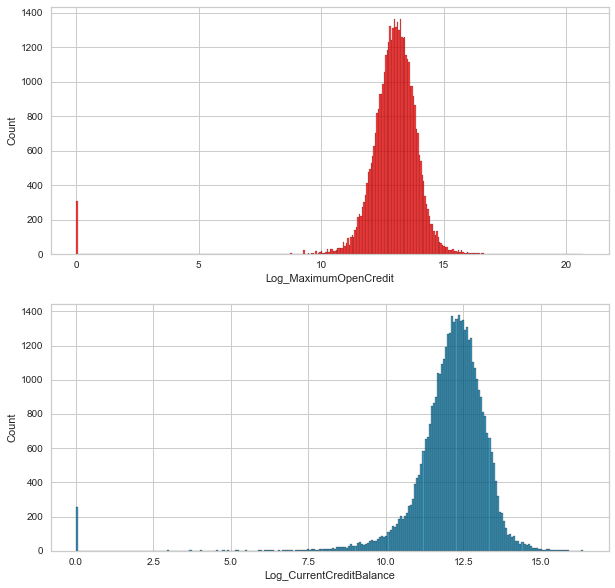

In [27]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(2,1, figsize=(10, 10))

sns.histplot(data = loan_fe, x = 'Log_MaximumOpenCredit', color = 'red', ax =axs[0])
sns.histplot(data = loan_fe, x = 'Log_CurrentCreditBalance', ax = axs[1])


In [25]:
# keep copy of featured engineered dataset 
loan_fe.to_csv('loan_fe.csv', index = False)

### Feature Enginnering Summary

After performing feature engineering 4 new variables were created and 2 were transformed with a logarithmic function.The main goal of this process is to improve model performance and further reveal important data insights.

In [16]:
X2 = loan_fe.drop(columns= ['Loan Status'])
y2 = loan_fe['Loan Status']

In [17]:
from sklearn.model_selection import train_test_split
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, random_state=0) 

# Models

 Smote Technique

The target variable is distributed unevenly, 77.3% for No default and 21.7% for default. This class imbalance may cause the model to achieve a decent degree of accuracy, but it may not be able to either identify or predict actual loan charge-off on unseen data. Therefore it is important to oversample the minority class of loan charge-off.

### Logistic Regression

The Logistic Regression model requires input variables be set to the same scale or else variables with larger coefficients can show dominance over other variables, when in fact their importance may be exaggerated. This dataset has a range of scales that must be transformed prior to fitting the model. 

In [18]:
from imblearn.over_sampling import SMOTE  
smt = SMOTE()
X2_train, y2_train = smt.fit_sample(X2_train, y2_train)

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

pipeline_log = Pipeline([('scalar',StandardScaler()),
                        ('log', LogisticRegression())])
    
log_model = pipeline_log.fit(X2_train, y2_train)

In [20]:
pred = log_model.predict(X2_test)    

 Evaluation

In [21]:
from sklearn.metrics import classification_report
print(classification_report(y2_test, pred))   

              precision    recall  f1-score   support

           0       0.76      0.79      0.78      8124
           1       0.32      0.28      0.30      2822

    accuracy                           0.66     10946
   macro avg       0.54      0.54      0.54     10946
weighted avg       0.65      0.66      0.65     10946



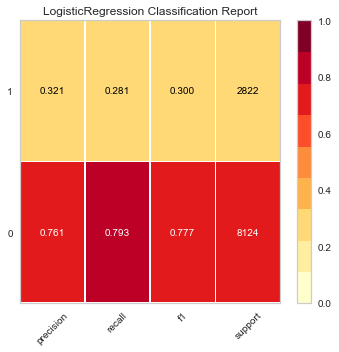

In [29]:
from yellowbrick.classifier import ClassificationReport


# Specify the target classes


plt.figure(figsize=(5, 5))
visualizer = ClassificationReport(log_model, support=True)

visualizer.fit(X2_train, y2_train)        # Fit the visualizer and the model
visualizer.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer.show()        

In [22]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y2_test, pred)

0.5374061193945999

Cross-Validation

C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


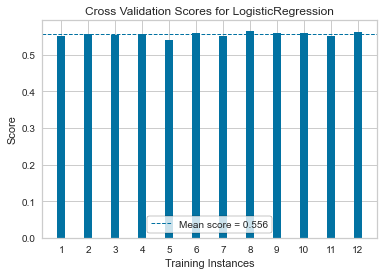

In [26]:
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import CVScores

# Create a cross-validation strategy
cv = StratifiedKFold(n_splits=12, random_state=42)

# Instantiate the classification model and visualizer
model1 = LogisticRegression()
visualizer = CVScores(model1, cv=cv, scoring='f1_weighted')

visualizer.fit(X2_train, y2_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


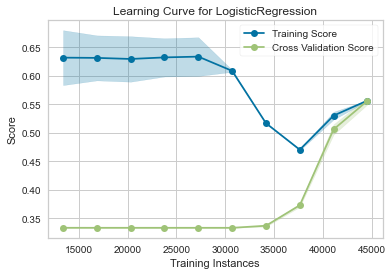

In [24]:
from yellowbrick.model_selection import LearningCurve

cv = StratifiedKFold(n_splits=12)
sizes = np.linspace(0.3, 1.0, 10)

# Instantiate the classification model and visualizer
model3 = LogisticRegression()
visualizer = LearningCurve(
    model3, cv=cv, scoring='f1_weighted', train_sizes=sizes, n_jobs=4
)

visualizer.fit(X2_train, y2_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

Stats Mod Method

In [25]:
import statsmodels.api as sm
logit_model=sm.Logit(y2,X2.astype(float))
result=logit_model.fit()
print(result.summary2())

C:\Users\nsold\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Optimization terminated successfully.
         Current function value: 0.557101
         Iterations 5
                               Results: Logit
Model:                   Logit               Pseudo R-squared:    0.026      
Dependent Variable:      Loan Status         AIC:                 48820.0045 
Date:                    2020-12-16 18:19    BIC:                 48985.0570 
No. Observations:        43782               Log-Likelihood:      -24391.    
Df Model:                18                  LL-Null:             -25047.    
Df Residuals:            43763               LLR p-value:         8.0669e-268
Converged:               1.0000              Scale:               1.0000     
No. Iterations:          5.0000                                              
-----------------------------------------------------------------------------
                               Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
------------------------------------------------------------------------

### Random Forest

In [30]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import rfecv

In [31]:
rf = RandomForestClassifier(n_estimators=200, max_depth=None,
min_samples_split=2, random_state=0)

In [32]:
rf_model = rf.fit(X2_train, y2_train)

In [33]:
pred2 = rf_model.predict(X2_test)

In [34]:
print(classification_report(y2_test, pred2))

              precision    recall  f1-score   support

           0       0.76      0.90      0.82      8124
           1       0.38      0.17      0.23      2822

    accuracy                           0.71     10946
   macro avg       0.57      0.54      0.53     10946
weighted avg       0.66      0.71      0.67     10946



C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


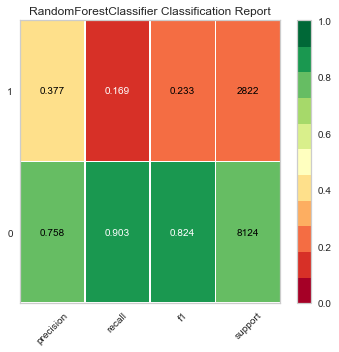

In [47]:
plt.figure(figsize=(5, 5))
visualizer2 = ClassificationReport(rf_model, cmap='RdYlGn', support=True)

visualizer2.fit(X2_train, y2_train)        # Fit the visualizer and the model
visualizer2.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer2.show()        

C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


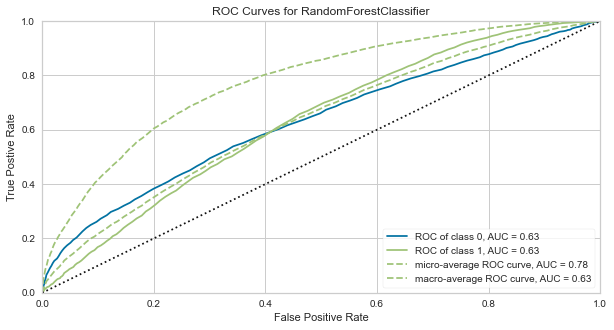

In [32]:
from yellowbrick.classifier import ROCAUC
import matplotlib as mpl
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
model = RandomForestClassifier(n_estimators= 200, max_depth= None)
visualizer = ROCAUC(model)

visualizer.fit(X2_train, y2_train)        # Fit the training data to the visualizer
visualizer.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer.show()                       # Finalize and show the figure

C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


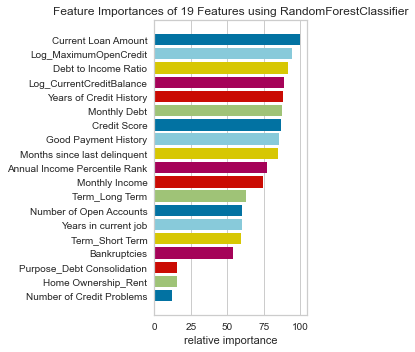

In [48]:
from yellowbrick.model_selection import FeatureImportances

plt.figure(figsize=(5, 5))
model = RandomForestClassifier(n_estimators=200)
viz3 = FeatureImportances(model)
viz3.fit(X2_train, y2_train) 
viz3.show()

C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


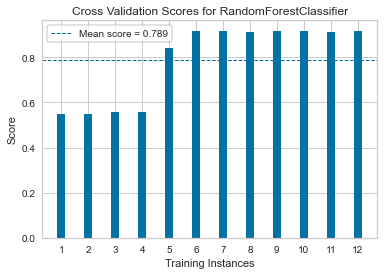

In [34]:
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import CVScores


# Create a cross-validation strategy
cv = StratifiedKFold(n_splits=12, random_state=42)

# Instantiate the classification model and visualizer
model2 = RandomForestClassifier()
visualizer = CVScores(model2, cv=cv, scoring='f1_weighted')

visualizer.fit(X2_train, y2_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

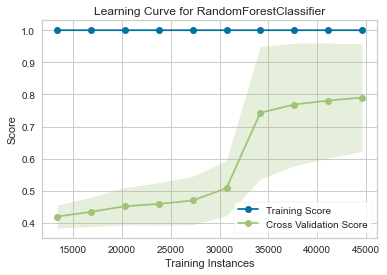

In [35]:
from yellowbrick.model_selection import LearningCurve

cv = StratifiedKFold(n_splits=12)
sizes = np.linspace(0.3, 1.0, 10)

# Instantiate the classification model and visualizer
model2 = RandomForestClassifier()
visualizer = LearningCurve(
    model2, cv=cv, scoring='f1_weighted', train_sizes=sizes, n_jobs=4
)

visualizer.fit(X2_train, y2_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

### Gradient Boosted Classifier

In [49]:
from sklearn.ensemble import GradientBoostingClassifier
gbt = GradientBoostingClassifier(n_estimators=192)

gbt_model = gbt.fit(X2_train, y2_train)

In [50]:
pred3 = gbt_model.predict(X2_test) 

In [51]:
print(classification_report(y2_test, pred3))

              precision    recall  f1-score   support

           0       0.76      0.89      0.82      8124
           1       0.36      0.17      0.23      2822

    accuracy                           0.71     10946
   macro avg       0.56      0.53      0.53     10946
weighted avg       0.65      0.71      0.67     10946



C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


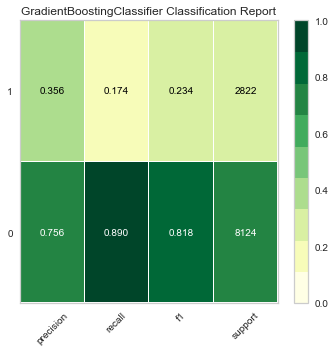

In [53]:
plt.figure(figsize=(5, 5))
visualizer4 = ClassificationReport(gbt_model, cmap='YlGn', support=True)

visualizer4.fit(X2_train, y2_train)        # Fit the visualizer and the model
visualizer4.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer4.show()        

In [39]:
roc_auc_score(y2_test, pred3)

0.5296695514353879

C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


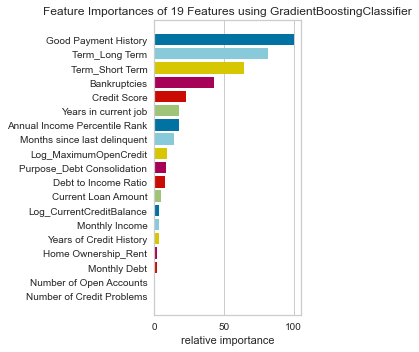

In [62]:
from yellowbrick.model_selection import FeatureImportances

plt.figure(figsize=(5, 5))
model = GradientBoostingClassifier(n_estimators=200)
viz7 = FeatureImportances(model, cmap = 'coolwarm')
viz7.fit(X2_train, y2_train) 
viz7.show()

### Ada Boost

In [54]:
from sklearn.ensemble import AdaBoostClassifier
adb = AdaBoostClassifier(n_estimators=100, random_state=0)

adb_model = adb.fit(X2_train, y2_train)

In [55]:
pred4 = adb_model.predict(X2_test)

In [56]:
print(classification_report(y2_test, pred4))

              precision    recall  f1-score   support

           0       0.76      0.86      0.81      8124
           1       0.34      0.20      0.25      2822

    accuracy                           0.69     10946
   macro avg       0.55      0.53      0.53     10946
weighted avg       0.65      0.69      0.66     10946



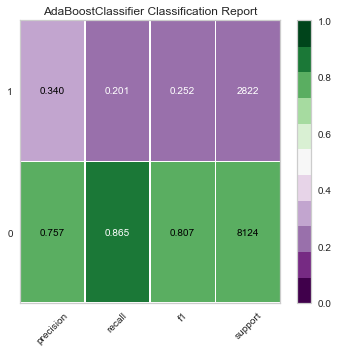

In [57]:
plt.figure(figsize=(5, 5))
visualizer5 = ClassificationReport(adb_model, cmap='PRGn', support=True)

visualizer5.fit(X2_train, y2_train)        # Fit the visualizer and the model
visualizer5.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer5.show()

In [44]:
roc_auc_score(y2_test, pred4)

0.5368444845504182

### Support Vector Machines

In [58]:
from sklearn.svm import SVC   
pipeline_svc = Pipeline([('scalar',StandardScaler()),
                        ('svc', SVC(C= 10, gamma = .005))])
    
svc_model = pipeline_svc.fit(X2_train, y2_train)

In [59]:
pred5 = svc_model.predict(X2_test)

In [60]:
print(classification_report(y2_test, pred5))

              precision    recall  f1-score   support

           0       0.75      0.89      0.81      8124
           1       0.32      0.15      0.21      2822

    accuracy                           0.70     10946
   macro avg       0.54      0.52      0.51     10946
weighted avg       0.64      0.70      0.66     10946



C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


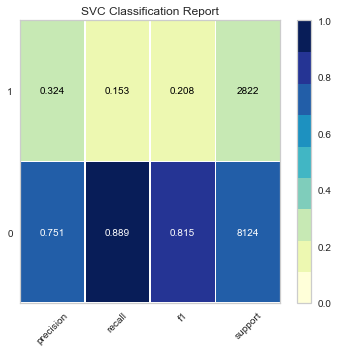

In [61]:
plt.figure(figsize=(5, 5))
visualizer6 = ClassificationReport(svc_model, cmap='YlGnBu', support=True)

visualizer6.fit(X2_train, y2_train)        # Fit the visualizer and the model
visualizer6.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer6.show()

In [46]:
roc_auc_score(y2_test, pred5)

0.523624954243946

### Naive Bayes

In [63]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb_model = gnb.fit(X2_train, y2_train) 

In [64]:
pred6 = gnb_model.predict(X2_test)

In [65]:
print(classification_report(y2_test, pred6))

              precision    recall  f1-score   support

           0       0.77      0.24      0.37      8124
           1       0.27      0.79      0.40      2822

    accuracy                           0.39     10946
   macro avg       0.52      0.52      0.39     10946
weighted avg       0.64      0.39      0.38     10946



C:\Users\nsold\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


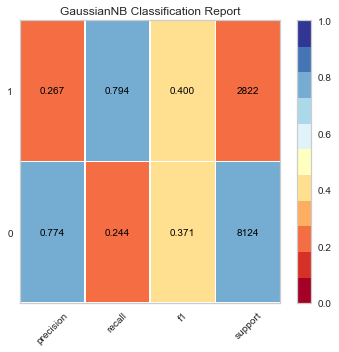

In [66]:
plt.figure(figsize=(5, 5))
visualizer8 = ClassificationReport(gnb_model, cmap='RdYlBu', support=True)

visualizer8.fit(X2_train, y2_train)        # Fit the visualizer and the model
visualizer8.score(X2_test, y2_test)        # Evaluate the model on the test data
visualizer8.show()

In [50]:
roc_auc_score(y2_test, pred6)

0.5176312164986299

# Conclusions & Summary

|Model |Accuracy| Precision| Recall | AUC|
|------|------|----------|----------|----|
|Logistic Regression|66 % |.54| .54|.53|
|Random Forest|72 % |.57| .54|.63|
|Gradient Boosted Classifier|71 % |.55| .53|.53|
|Ada Boost|69 % |.55| .53|.53|
|Support Vector Classifier|70 % |.54| .52|.52|
|Naive Bayes|39 % |.52| .52|.52|

Overall, the results from the 6 different modeling methods were mostly unsatisfactory. None of the classifiers except Random Forest were able to achieve at least a legitimate AUC (Area Under the Curve) score, meaning that distinguishing between a particular class was about as effective as simply guessing. Even with Random Forest's AUC score of .63 is still not enough to be confident in the model's ability to separate loan-charge off from fully paid status. The accuracy of each classifier ranged from a low 39% to a high of 72%. Precision and Recall hovered around .52 to .57.

 

Class imbalance was a prime concern for this project. Preliminary model runs showed each classifier had a difficult time identifying class 1, with virtually all obtaining a recall score of 90+% for class 0 (fully paid) and less than 10% for Loan Charge-offs. The models benefited from the utilization of over-sampling the minority class of loan-charge off. Once SMOTE was used, models were able to improve only slightly their ability to identify true positive samples. The Naive Bayes model especially benefited by having a recall of class 1 at .79. Under-sampling the majority class was also tried and the results were the same. 

 

Feature Engineering did not have as dramatic as an effect on model performance as was anticipated. There was not a noticeable improvement in Accuracy, Precision, Recall, or AUC score from the baseline model to models with engineered features. Different combinations of new variables and omitted ones were tested and re-tested on the models and the results were stagnant. The creation of the Debt to Income ratio did produce positive results and was consistently ranked as one of the most important variables across all models. Annual Income Percentile was another engineered feature that signified importance. The Good Payment History was highly effective in some models but not in others. It did not show statistical significance in Logistic Regression but was the most important feature in the Gradient Boosted Classifier.

 

Models were tuned with different hyper-parameter settings to reach optimal performance. With adjustments to models, the outcomes were still relatively stable and evaluation metrics did not change. Model parameters were also tested and adjusted in both Rapid Miner and Salford Predictive Modeler. For example, it was found that the optimal number of trees for Random Forest was 200, and for Support Vector Machines a gamma value of .005 and C value of 10. Looking at the learning curve for both Logistic Regression and Random Forest there is an upward trend of model performance between the training set and cross-validation score around 45,000 observations. Judging from this trend, models may have improved performance with more observations. 

 

Based on the model comparisons and evaluation, Random Forest appears to be the best performing model for this business context. Random Forest achieved the highest accuracy, precision, recall, and AUC. The model does have some ability to predict Loan Charges Offs and provide variable insight on the most contributing factors. By way of top 3 variable importance rankings, Current Loan Amount, Log Maximum Open Credit and Debt to Income Ratio are the most important in understanding if a borrower is likely to fail to pay their loan on time. The client can create business implications based on these variables, and potentially tighten restrictions when it comes to issuing a loan when a borrower is asking for a certain amount. Although Random Forest is the model of choice based on the project work it is hardly ideal for production and the business case. The model does not have enough potency to correctly identify true positive instances of loan charge-offs. Recalling only about 17% of class 1, is not sufficient. This dataset even with proper preparation, feature engineering , and model selection is lacking. It would be recommended for the client to provide more observations and additional features around loan charge-offs. 50,000 observations and 18 original features is not enough to create a sound model for the client. There could be added benefit from demographic information of the borrower or additional information on the loan characteristics.Considering that the top model is 72% accurate with an AUC of .63 this project needs additional resources and cannot be considered a success, additional work is needed.

